In [5]:
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.stats as sc
from pathlib import Path
import networkx as nx
from tqdm.autonotebook import tqdm, trange

import random
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Lab/Utils/Python/Networks/')

from safepy import safe

%matplotlib inline
plt.rcParams.update({'font.size': 15})

## Read dataset with column_names: 
### 'gene_id','p_value', 'chromosome', 'start', 'end', 'strand', 'gene_symbol', 'numSnps', 'Status'

In [6]:
data = [pd.read_csv(i, encoding='utf-8', sep='\t') for i in tqdm(Path('./data/output/').glob('*sum.genescores.txt'))]

## Some dataframe transformations:
1. Remove genes that are not represent for each feature
2. Save gene_symbols for further analysis
3. Remove useless columns
4. Create matrix where rows are genes, columns are features, and ij-cell contains p_value for i-gene and j-feature

In [7]:
# Preparation of the set of genes which are represented for each feature

genes = set(data[0].gene_id)
for i in trange(len(data)):
    genes &= set(data[i].gene_id)
print(len(genes))


21791


In [8]:
# Remove genes that are not represented for each feature

data = [data[i][data[i].gene_id.isin(genes)] for i in range(len(data))]

In [9]:
# Save gene_symbols for further analysis

gene_symbols = data[0].gene_symbol

In [10]:
# Remove useless columns

for i, df in enumerate(data):
    data[i] = df.drop(['chromosome', 'start', 'end', 'strand', 'gene_symbol', 'numSnps', 'Status'], axis='columns')

In [11]:
# Create gene-feature matrix of p_values

gene_fenotype_matrix = np.zeros((len(data[0].index), len(data)))
for i, df in enumerate(data):
    gene_fenotype_matrix[:, i] = df[['pvalue']].to_numpy()[:, 0]

### Optimal clusters number searching using silhouette analysis for hierarchical clustering with euclidean metric

In [3]:
# Silhouette analysis for kmeans-clusterisation: the closer to +1, the better.
# k-means clusterisation use euclidean metrics opposed to hierarchical clusterisation with different metrics
# Optimal number of clusters is 8500.

scores = []
for i in np.logspace(1, np.log2(len(gene_fenotype_matrix)), 50, base=2):
    i = int(i)
    kmeans = KMeans(n_clusters=i).fit_predict(gene_fenotype_matrix)
    score = silhouette_score(gene_fenotype_matrix, kmeans)
    scores.append(score)
    print(i, score)

In [1]:
# Silhouette analysis for hierarchical clusterisation with euclidean metric: 
# Optimal number of clusters is 7346


clustering = AgglomerativeClustering(n_clusters=2, compute_full_tree=True, memory='tmp').fit(gene_fenotype_matrix)

scores = []
for i in np.logspace(5, np.log2(len(gene_fenotype_matrix)), 25, base=2):
    
    i = int(i)
    clustering.set_params(n_clusters=i)
    clusters = clustering.fit_predict(gene_fenotype_matrix)
    score = silhouette_score(gene_fenotype_matrix, clusters)
    scores.append(score)
    
    print(f'{i}: {score:.4f}')

### Gene correlation matrix calculation

In [443]:
# To speed up the calculations, wrote own function:

def correlate(x, y):
    x = x - np.mean(x, axis=1, keepdims=True)
    y = y - np.mean(y, axis=1, keepdims=True)
    x = x / np.std(x, axis=1, keepdims=True)
    y = y / np.std(y, axis=1, keepdims=True)

    return x.dot(y.T) / x.shape[1]    

In [444]:
# Gene correlation matrix calculation

n = gene_fenotype_matrix.shape[0]
corr_matrix = np.zeros((n, n)) 

for i in range(0, n, 500):
    for j in range(0, n, 500):
        corr_matrix[i : i + 500, j : j + 500] = correlate(gene_fenotype_matrix[i:i + 500], 
                                                            gene_fenotype_matrix[j:j + 500])
        

### Optimal clusters number searching using silhouette analysis for hierarchical clustering with metrics:
$d(x, y) = (1 - corr(x, y))^p$, $p < 0.25$

In [2]:
# Silhouette analysis for hierarchical clusterisation with metric d(x, y) = (1 - corr(x, y)) ** p, p =0.25
# Optimal number of clusters is 7346
# p < 1 to move together distant clusters

p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering = AgglomerativeClustering(
    n_clusters=2, compute_full_tree=True, memory='tmp1', linkage="complete", affinity="precomputed"
).fit(dist_matrix)

scores = []
for i in np.logspace(5, np.log2(len(dist_matrix)), 25, base=2):
    
    i = int(i)
    clustering.set_params(n_clusters=i)
    clusters = clustering.fit_predict(dist_matrix)
    score = silhouette_score(dist_matrix, clusters, metric="precomputed")
    scores.append(score)
    
    print(f'{i}: {score:.4f}')

## Make a number of different clusterisations, so that we can then investigate them using enrichment analysis

In [387]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering = AgglomerativeClustering(
    n_clusters=7440, compute_full_tree=True, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters = clustering.fit_predict(dist_matrix)

In [376]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clusters_complete = AgglomerativeClustering(
    n_clusters=7440, memory='tmp1', linkage="complete", affinity="precomputed"
).fit_predict(dist_matrix)

In [40]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering50 = AgglomerativeClustering(
    n_clusters=50, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters50 = clustering50.fit_predict(dist_matrix)

In [124]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clusters50complete = AgglomerativeClustering(
    n_clusters=50, memory='tmp1', linkage="complete", affinity="precomputed"
).fit_predict(dist_matrix)

/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/sklearn/cluster/hierarchical.py:868: UserWarning: Persisting input arguments took 9.16s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  **kwargs)


In [125]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clusters50single = AgglomerativeClustering(
    n_clusters=50, memory='tmp1', linkage="single", affinity="precomputed"
).fit_predict(dist_matrix)

/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/sklearn/cluster/hierarchical.py:868: UserWarning: Persisting input arguments took 9.21s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  **kwargs)


In [41]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering100 = AgglomerativeClustering(
    n_clusters=100, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters100 = clustering100.fit_predict(dist_matrix)

In [42]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering200 = AgglomerativeClustering(
    n_clusters=200, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters200 = clustering200.fit_predict(dist_matrix)

In [43]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering500 = AgglomerativeClustering(
    n_clusters=500, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters500 = clustering500.fit_predict(dist_matrix)

In [44]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering700 = AgglomerativeClustering(
    n_clusters=700, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters700 = clustering700.fit_predict(dist_matrix)

In [26]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering1000 = AgglomerativeClustering(
    n_clusters=1000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters1000 = clustering1000.fit_predict(dist_matrix)

In [27]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering2000 = AgglomerativeClustering(
    n_clusters=2000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters2000 = clustering2000.fit_predict(dist_matrix)

In [28]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering3000 = AgglomerativeClustering(
    n_clusters=3000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters3000 = clustering3000.fit_predict(dist_matrix)

In [29]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering4000 = AgglomerativeClustering(
    n_clusters=4000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters4000 = clustering4000.fit_predict(dist_matrix)

In [30]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering5000 = AgglomerativeClustering(
    n_clusters=5000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters5000 = clustering5000.fit_predict(dist_matrix)

In [31]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering6000 = AgglomerativeClustering(
    n_clusters=6000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters6000 = clustering6000.fit_predict(dist_matrix)

In [32]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering8000 = AgglomerativeClustering(
    n_clusters=8000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters8000 = clustering8000.fit_predict(dist_matrix)

In [33]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering9000 = AgglomerativeClustering(
    n_clusters=9000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters9000 = clustering9000.fit_predict(dist_matrix)

In [34]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering10000 = AgglomerativeClustering(
    n_clusters=10000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters10000 = clustering10000.fit_predict(dist_matrix)

In [35]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering11000 = AgglomerativeClustering(
    n_clusters=11000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters11000 = clustering11000.fit_predict(dist_matrix)

In [36]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering12000 = AgglomerativeClustering(
    n_clusters=12000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters12000 = clustering12000.fit_predict(dist_matrix)

In [37]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering13000 = AgglomerativeClustering(
    n_clusters=13000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters13000 = clustering13000.fit_predict(dist_matrix)

In [38]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering14000 = AgglomerativeClustering(
    n_clusters=14000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters14000 = clustering14000.fit_predict(dist_matrix)

In [39]:
p = 0.25
dist_matrix = 1 - np.sign(corr_matrix) * np.abs(corr_matrix) ** p
dist_matrix = np.clip(dist_matrix, 0, 2)

clustering15000 = AgglomerativeClustering(
    n_clusters=15000, memory='tmp1', linkage="average", affinity="precomputed"
).fit(dist_matrix)

clusters15000 = clustering15000.fit_predict(dist_matrix)

### Look at the sizes of 100 largest clusters for each clusterizations

In [5]:
_, counts = np.unique(clusters, return_counts=True)
print(np.sort(counts)[::-1][:100])

In [377]:
_, counts = np.unique(clusters_complete, return_counts=True)
print(np.sort(counts)[::-1][:100])

[84 80 48 42 37 36 34 32 32 31 29 27 25 25 25 23 22 22 22 22 21 21 21 21
 21 20 20 19 19 19 19 19 18 18 18 18 18 18 17 17 17 17 17 17 17 17 17 16
 16 16 16 16 16 16 16 15 15 15 15 15 15 14 14 14 14 14 14 14 14 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 12 12 12 12 12 12 12 12 12 12
 12 12 12 12]


In [45]:
_, counts50 = np.unique(clusters50, return_counts=True)
print(np.sort(counts50)[::-1][:100])

[19656   278   265   206   100    71    64    63    57    54    47    45
    45    43    42    42    41    41    39    36    31    30    29    29
    28    27    27    26    24    23    23    21    21    21    21    20
    20    18    14    13    12    12    11    11    10    10     8     6
     6     4]


In [126]:
_, counts50 = np.unique(clusters50complete, return_counts=True)
print(np.sort(counts50)[::-1][:100])

[3263 2644 2570 2370  894  742  649  597  534  481  414  396  395  375
  297  281  270  265  234  229  220  204  202  196  196  179  166  165
  161  154  143  137  133  128  116  112  111  108  105  104   99   99
   98   95   90   87   78   74   72   59]


In [46]:
_, counts100 = np.unique(clusters100, return_counts=True)
print(np.sort(counts100)[::-1][:100])

[18323   450   139   133   128   116    79    78    70    67    65    64
    63    57    52    49    47    43    43    42    42    42    41    39
    39    36    36    35    34    34    33    33    31    31    30    29
    29    29    28    28    27    27    26    26    26    25    25    24
    24    24    24    23    22    22    21    21    21    21    21    21
    20    20    20    20    18    18    17    17    17    17    17    16
    15    14    14    14    14    14    14    13    13    13    13    13
    12    12    12    12    11    11    11    11    10    10     9     8
     7     6     6     4]


In [47]:
_, counts200 = np.unique(clusters200, return_counts=True)
print(np.sort(counts200)[::-1][:100])

[17160   162   161   103   102    89    88    85    81    62    58    57
    56    53    51    50    50    50    47    46    45    44    43    42
    40    38    37    36    35    35    34    34    34    33    33    32
    32    31    31    31    30    30    29    29    29    28    28    28
    28    27    27    27    27    27    26    26    26    26    25    25
    25    25    24    24    24    23    23    23    23    23    23    23
    23    22    21    21    21    21    21    20    20    20    20    20
    20    19    19    18    17    17    17    17    17    17    17    17
    17    16    16    16]


In [48]:
_, counts500 = np.unique(clusters500, return_counts=True)
print(np.sort(counts500)[::-1][:100])

[13529   283   245    90    82    81    80    80    73    71    69    66
    63    59    59    58    58    55    53    52    49    49    47    44
    43    42    41    39    37    37    37    37    36    36    36    36
    35    35    34    34    34    34    33    33    33    33    32    31
    31    31    30    30    30    30    29    29    29    29    29    28
    28    27    27    27    26    26    26    26    26    25    25    25
    24    24    24    24    24    24    24    24    24    24    24    23
    23    23    23    23    23    23    23    23    23    23    23    22
    22    22    22    22]


In [49]:
_, counts700 = np.unique(clusters700, return_counts=True)
print(np.sort(counts700)[::-1][:100])

[11926   123   104   100    99    95    84    82    80    70    63    60
    57    57    57    57    55    54    52    50    50    50    49    47
    47    46    45    44    43    43    42    41    40    40    40    39
    39    39    39    39    39    37    37    36    36    36    36    35
    34    34    34    34    33    33    33    33    32    31    31    31
    31    30    30    30    29    29    29    29    29    29    29    28
    28    28    27    27    27    26    26    26    25    25    25    25
    25    24    24    24    24    24    24    23    23    23    23    23
    23    23    23    23]


In [55]:
_, counts1000 = np.unique(clusters1000, return_counts=True)
print(np.sort(counts1000)[::-1][:100])

[9933   92   86   85   80   79   76   73   72   70   66   64   64   61
   61   60   59   58   57   55   55   53   52   51   50   50   48   48
   47   46   46   45   45   44   44   44   44   43   43   43   43   43
   40   40   39   39   38   38   37   37   37   36   36   35   34   34
   34   34   33   33   33   32   32   31   31   31   31   31   30   30
   30   30   30   30   29   29   29   29   28   28   28   27   27   27
   27   26   26   26   26   26   26   25   25   25   25   25   25   24
   24   24]


In [54]:
_, counts2000 = np.unique(clusters2000, return_counts=True)
print(np.sort(counts2000)[::-1][:100])

[3641  287  186  174  147  142  134  122  115  110  104  100   98   95
   86   85   83   83   79   77   70   69   64   61   59   59   57   57
   56   56   55   54   52   49   48   48   47   47   47   46   46   46
   45   43   43   42   42   40   40   40   40   39   39   39   39   38
   38   38   38   37   37   37   37   36   35   35   35   34   34   34
   34   33   33   32   32   32   31   31   30   30   30   30   30   30
   30   30   30   29   29   29   29   29   28   28   28   28   28   28
   28   27]


In [56]:
_, counts3000 = np.unique(clusters3000, return_counts=True)
print(np.sort(counts3000)[::-1][:100])

[854 309 169 163 143 113 109 108 107  94  93  72  68  66  64  62  57  55
  54  51  51  49  48  48  47  47  46  46  46  45  45  44  44  44  43  42
  42  40  40  40  39  38  38  37  37  37  36  36  36  36  35  35  35  35
  34  34  34  33  33  33  32  32  32  31  31  31  31  31  31  30  30  30
  30  29  29  29  28  28  28  28  28  28  27  27  27  27  27  27  27  27
  27  26  26  26  26  26  26  26  26  26]


In [57]:
_, counts4000 = np.unique(clusters4000, return_counts=True)
print(np.sort(counts4000)[::-1][:100])

[293 179 100  93  87  73  66  66  61  54  54  53  53  51  49  48  48  47
  45  45  45  43  42  42  41  40  38  38  37  36  36  36  35  35  35  35
  35  34  33  33  32  32  32  32  32  31  30  29  29  29  29  29  29  29
  29  28  28  28  27  27  27  27  27  26  26  26  26  26  25  25  25  25
  25  25  24  24  24  24  24  23  23  23  23  23  23  23  23  22  22  22
  22  22  22  22  22  21  21  21  21  21]


In [58]:
_, counts5000 = np.unique(clusters5000, return_counts=True)
print(np.sort(counts5000)[::-1][:100])

[265  93  87  83  66  54  48  48  43  43  40  39  38  36  36  36  34  33
  33  33  32  32  32  31  31  30  30  30  29  29  29  29  28  28  28  28
  27  27  27  26  26  26  25  24  24  24  24  24  23  23  23  23  22  22
  22  22  22  22  22  22  22  22  22  22  22  21  21  21  21  21  21  21
  21  20  20  20  20  20  20  20  20  19  19  19  19  19  19  19  19  19
  19  19  18  18  18  18  18  18  18  18]


In [59]:
_, counts6000 = np.unique(clusters6000, return_counts=True)
print(np.sort(counts6000)[::-1][:100])

[150 103  93  73  55  48  45  41  39  39  36  34  33  33  32  32  31  30
  30  30  30  29  29  29  28  28  27  27  27  26  26  26  26  26  24  24
  24  23  23  23  22  22  22  22  22  22  22  22  22  21  21  21  21  21
  21  21  20  20  20  20  20  20  19  19  19  19  19  19  19  19  18  18
  18  18  18  18  18  18  18  18  18  17  17  17  17  17  17  17  17  17
  17  17  17  17  17  17  16  16  16  16]


In [60]:
_, counts8000 = np.unique(clusters8000, return_counts=True)
print(np.sort(counts8000)[::-1][:100])

[62 55 52 42 38 36 32 32 31 30 29 29 29 28 27 26 25 24 23 21 21 21 21 20
 20 20 19 19 18 18 18 18 18 18 17 17 17 17 17 17 17 17 17 16 16 16 16 16
 16 16 16 15 15 15 15 15 15 15 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 13 13 13 13 13 13 13 13 13 13 13 12 12 12 12 12 12 12 12 12
 12 12 12 12]


In [61]:
_, counts9000 = np.unique(clusters9000, return_counts=True)
print(np.sort(counts9000)[::-1][:100])

[42 38 36 35 32 32 28 28 27 25 24 23 23 21 21 21 20 20 19 19 19 19 19 18
 18 18 18 17 17 17 17 17 17 17 16 16 16 16 16 16 16 15 15 15 15 15 15 15
 15 14 14 14 14 14 14 14 14 14 14 14 14 13 13 13 13 13 13 13 13 13 13 13
 13 12 12 12 12 12 12 12 12 12 12 12 12 12 11 11 11 11 11 11 11 11 11 11
 11 11 11 11]


In [63]:
_, counts10000 = np.unique(clusters10000, return_counts=True)
print(np.sort(counts10000)[::-1][:100])

[42 38 36 35 30 26 25 23 22 22 21 21 21 20 19 19 19 19 19 18 18 17 17 17
 17 17 16 16 16 16 16 16 15 15 15 15 15 14 14 14 14 14 14 14 13 13 13 13
 13 13 13 13 13 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 10 10 10 10 10 10 10
 10 10 10 10]


In [69]:
_, counts11000 = np.unique(clusters11000, return_counts=True)
print(np.sort(counts11000)[::-1][:100])

[42 38 31 30 26 23 23 22 22 22 21 19 19 19 18 18 17 17 16 16 16 16 15 15
 15 15 14 14 14 14 13 13 13 13 13 13 13 13 12 12 12 12 12 12 12 12 12 12
 12 12 12 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10  9  9  9]


In [67]:
_, counts12000 = np.unique(clusters12000, return_counts=True)
print(np.sort(counts12000)[::-1][:100])

[38 29 26 23 22 22 21 19 17 16 16 16 15 15 15 15 15 14 14 14 14 13 13 13
 13 13 13 13 13 12 12 12 12 12 12 12 12 12 12 11 11 11 11 11 11 11 11 11
 11 11 11 11 11 11 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9]


In [70]:
_, counts13000 = np.unique(clusters13000, return_counts=True)
print(np.sort(counts13000)[::-1][:100])

[38 28 26 23 22 22 21 17 16 15 15 15 15 14 14 14 14 13 13 13 13 13 13 12
 12 12 12 12 12 11 11 11 11 11 11 11 11 11 11 11 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9  9  9  9  9  9  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8]


In [71]:
_, counts14000 = np.unique(clusters14000, return_counts=True)
print(np.sort(counts14000)[::-1][:100])

[38 28 24 23 22 22 16 16 15 15 14 14 13 13 13 13 12 12 12 12 12 11 11 11
 11 11 11 11 11 11 11 11 10 10 10 10 10 10  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9  9  9  9  9  9  9  9  9  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  7  7
  7  7  7  7]


In [72]:
_, counts15000 = np.unique(clusters15000, return_counts=True)
print(np.sort(counts15000)[::-1][:100])

[26 23 22 21 21 16 15 15 14 13 13 13 13 13 12 12 12 11 11 11 11 11 11 11
 10 10 10 10 10 10  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9  9
  9  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7
  7  7  7  7]


### Heatmap for correlation matrix

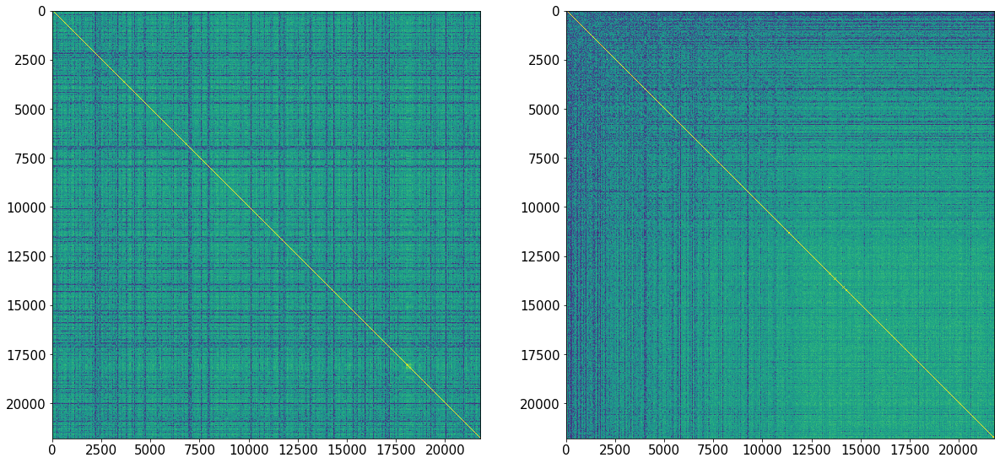

In [431]:
unique1000, cnts1000 = np.unique(clusters1000, return_counts=True)

o1000 = np.argsort(unique1000)
unique1000, cnts1000 = unique1000[o1000], cnts1000[o1000]

order1000 = np.argsort(clusters1000)
order1000_2 = np.argsort(cnts1000[clusters1000[order1000]], kind='stable')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)
ax2.imshow((np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)[order1000[order1000_2]][: , order1000[order1000_2]])
plt.show()

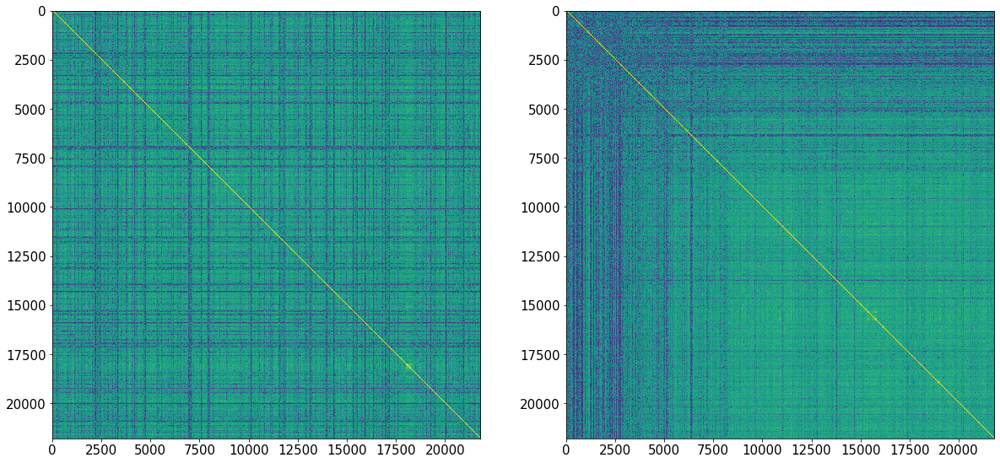

In [436]:
unique1000, cnts1000 = np.unique(clusters500, return_counts=True)

o1000 = np.argsort(unique1000)
unique1000, cnts1000 = unique1000[o1000], cnts1000[o1000]

order1000 = np.argsort(clusters500)
order1000_2 = np.argsort(cnts1000[clusters500[order1000]], kind='stable')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)
ax2.imshow((np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)[order1000[order1000_2]][: , order1000[order1000_2]])
plt.show()

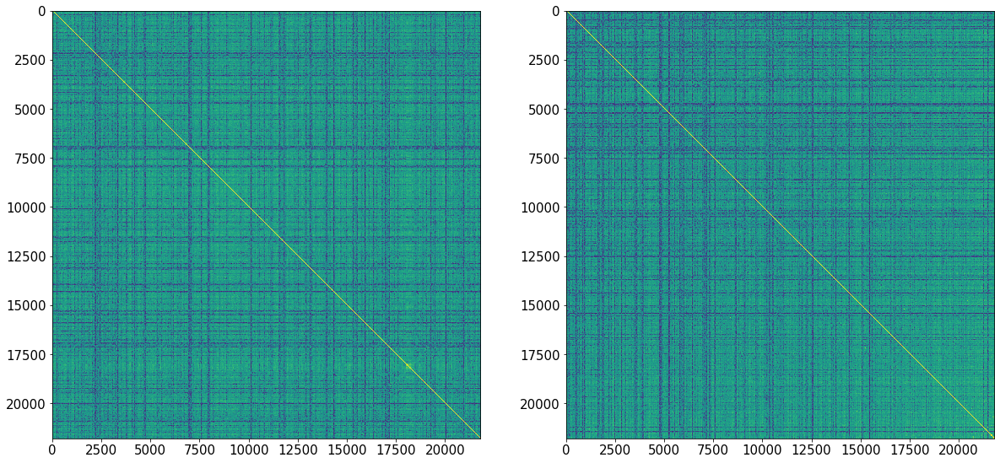

In [446]:
unique1000, cnts1000 = np.unique(clusters, return_counts=True)

o1000 = np.argsort(unique1000)
unique1000, cnts1000 = unique1000[o1000], cnts1000[o1000]

order1000 = np.argsort(clusters)
order1000_2 = np.argsort(cnts1000[clusters[order1000]], kind='stable')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)
ax2.imshow((np.sign(corr_matrix) * np.abs(corr_matrix) ** 0.5)[order1000[order1000_2]][: , order1000[order1000_2]])
plt.show()

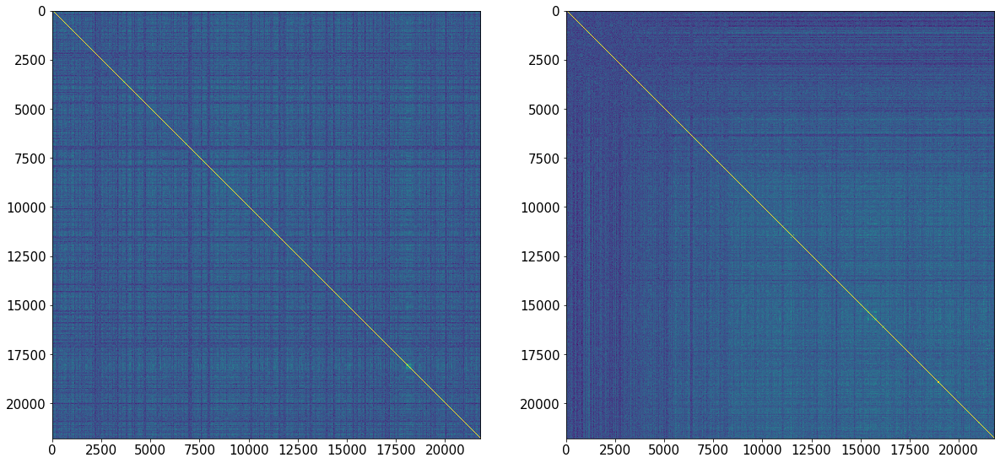

In [445]:
unique1000, cnts1000 = np.unique(clusters500, return_counts=True)

o1000 = np.argsort(unique1000)
unique1000, cnts1000 = unique1000[o1000], cnts1000[o1000]

order1000 = np.argsort(clusters500)
order1000_2 = np.argsort(cnts1000[clusters500[order1000]], kind='stable')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(np.sign(corr_matrix) * np.abs(corr_matrix))
ax2.imshow((np.sign(corr_matrix) * np.abs(corr_matrix))[order1000[order1000_2]][: , order1000[order1000_2]])
plt.show()

# Histogram of gene pair correlation values

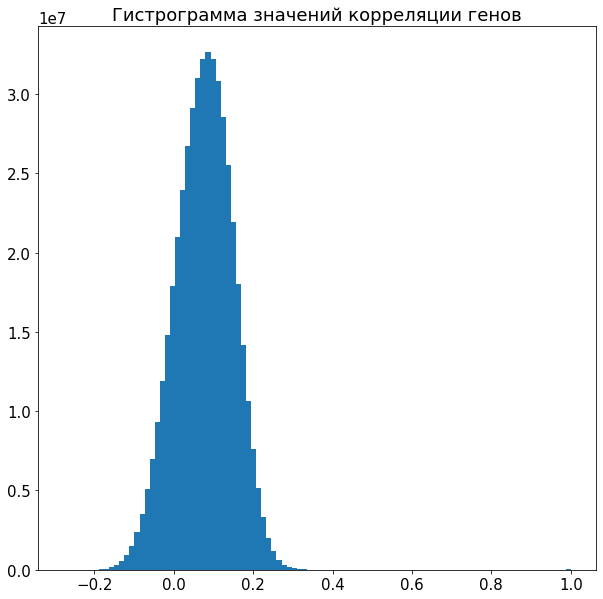

In [422]:
corr_flattened = corr_matrix.flatten()

plt.figure(figsize=(10,10))
plt.hist(corr_flattened, bins=100)
plt.title('Гистрограмма значений корреляции генов')
plt.show()


# Search for threshold for genes by correlation

In [ ]:
# The number of edges in the graph in which edges are left only between genes from identical clusters

sum(counts * (counts - 1) // 2)

In [13]:
# number of edges to leave in the graph

(58545 * 2 + 20000)

# take twice as much for visualization beauty

137090

In [227]:
corr_flattened.sort()
threshold = corr_flattened[-274180]
print(threshold)

0.31566622935007677


In [176]:
# Calculate an array of different cluster numbers and their sizes

unique, cnts = np.unique(clusters, return_counts=True)

o = np.argsort(unique)
unique, cnts = unique[o], cnts[o]

order = np.argsort(cnts[clusters])
cnts[clusters[order]][-5000]

8

## Adjacency matrix calculations

In [228]:
adjacency_matrix = (np.abs(corr_matrix) > threshold).astype(np.int)

# rearrange in clustering order so SAFE renders better

order = np.argsort(cnts[clusters])[::-1]
order = order[:5000] # leave only 5000 genes from the largest clusters (size> = 8)

clusters_in_order = clusters[order]
adjacency_matrix = adjacency_matrix[order][:, order]
np.fill_diagonal(adjacency_matrix, 0)

print(adjacency_matrix)

[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 1]
 [0 0 0 ... 1 0 1]
 [0 0 0 ... 1 1 0]]


## Draw our graph in SAFE

In [20]:
with open('network_test.txt', 'w') as network:
    for (i, j) in np.argwhere(adjacency_matrix):
        if i < j:
            network.write(f'{i}\t{j}\t{adjacency_matrix[i, j]}\n')

In [21]:
sf = safe.SAFE()

In [22]:
sf.load_network(network_file='network_test.txt')

Loading network from network_test.txt
Applying the spring-embedded network layout... (may take several minutes)
Calculating edge lengths...


/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: 
The is_numlike function was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use isinstance(..., numbers.Number) instead.
  if cb.is_numlike(alpha):


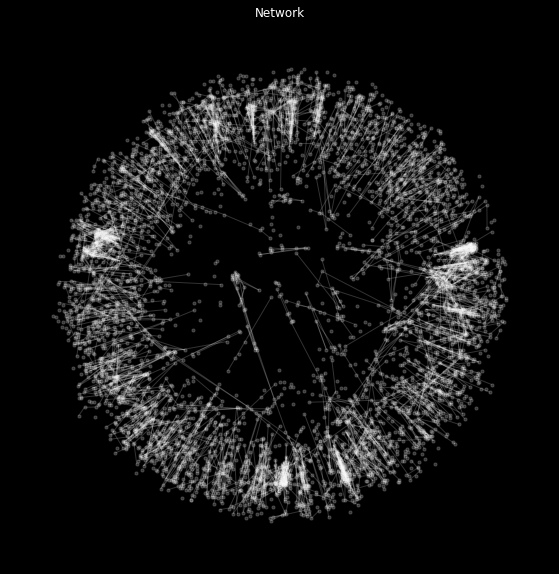

In [197]:
sf.plot_network()

### Auxiliary things

In [73]:
# Number of clusters with size <10

sum(np.unique(clusters10000, return_counts=True)[1] < 10)

9882

In [74]:
# Indexes of genes from cluster number 1

np.where(clusters10000 == 1)

(array([16102, 16103]),)

In [75]:
# feature values for genes from cluster 1

gene_fenotype_matrix[np.where(clusters10000 == 1)]

array([[0.66239415, 0.81971247, 0.01943453, ..., 0.50761109, 0.63026474,
        0.06410325],
       [0.6900063 , 0.42508217, 0.15853379, ..., 0.18036265, 0.73201964,
        0.08979282]])

In [82]:
# Gene identifiers from cluster 1

data[0].gene_id[np.where(clusters == 1)[0]]

12753      4175
17700    408187
17701    404203
17702    153218
17703     84651
Name: gene_id, dtype: int64

# Take gene sets for enrichment analysis 

In [451]:
uniq, cnt = np.unique(clusters500, return_counts=True)
o = np.argsort(cnt)
uniq_ordered = uniq[o]
cnt_ordered = cnt[o]

print(' '.join(gene_symbols.values[np.where(clusters500 == uniq_ordered[-2])[0]]))

C1orf109 CDCA8 EPHA10 MANEAL YRDC C1orf122 MTF1 INPP5B SF3A3 FHL3 UTP11L RNF220 MIR5584 HFM1 CDC7 SYT6 CACNA1E HMCN1 PLXNA2 PARP1 SFTA1P LINC00710 LOC100130539 CXCL12 LRRC20 EIF4EBP2 NODAL NANOS1 EIF3A SNORA19 FAM45B SFXN4 PRDX3 INPP5F MCMBP SEC23IP MIR4682 SCUBE2 MIR5691 KRT8P41 DENND5A TMEM41B FANCF ARHGAP42 TMEM133 PGR LOC101054525 SORL1 ZNF384 PIANP COPS7A MLF2 PTMS LAG3 CD4 SLCO1C1 SLCO1B3 SLCO1B7 SLCO1B1 SLC6A15 LINC00934 CCDC60 HSPH1 B3GALTL NYNRIN CBLN3 KHNYN SDR39U1 CMA1 CTSG GZMH GZMB LRFN5 SNORD56B SIPA1L1 LOC145474 MIR4710 INF2 ADSSL1 SIVA1 AKT1 ZBTB42 LINC00638 PLA2G4E PLA2G4D CEP152 SHC4 EID1 SV2B LINC00924 IL21R IL21R-AS1 GTF3C1 KIAA0556 CES5A NUP93 MIR138-2 SLC12A3 HERPUD1 CETP NLRC5 PKD1L2 BCMO1 SLC47A1 SNORA59A ALDH3A2 SLC47A2 ALDH3A1 ULK2 AKAP10 SPECC1 CCDC144CP LGALS9B KRT16P3 RUNDC3A SLC25A39 GRN FAM171A2 ITGA2B GPATCH8 DHX40 CLTC PTRH2 VMP1 MIR21 TUBD1 RPS6KB1 RNFT1 TBC1D3P1-DHX40P1 MIR4737 HEATR6 LOC645638 LOC653653 USP32 SCARNA20 PPM1D LOC146880 LOC440461 AMZ2 A

In [190]:
# For validation of GSEA results use the random gene set 

inds = np.random.permutation(20000)[:50]
print(' '.join(gene_symbols.values[inds]))

CCDC106 ACOT2 SPATA6 KCNJ15 SNORD59A RFWD3 FLJ44511 SENP3-EIF4A1 HPSE2 TP63 MIR4756 RPP25 SEMA3D POLE4 CDK19 SPINK13 BATF3 CAPG LOC728012 KCNJ2 MT1HL1 DGCR14 NAIP KPNB1 MIR1915 DGKQ FSIP2 RPUSD2 IQCA1 PRODH KRTAP10-1 SELM HTR3D DDX11 HELZ2 MIR3973 ALOXE3 LLPH ATP5G1 CSK STK4-AS1 ZNF257 CTNNB1 DNAH8 NFU1 CHRM1 DSCAM REG1B PEX3 GOLGA5


In [113]:
# Check that no one has swapped genes

flag = True

for i in trange(len(data)):
    if np.any(data[i].gene_id.values != data[0].gene_id.values):
        flag = False
        break
        
print(flag)


True


# Function drawing a cluster on a graph

In [341]:
import matplotlib
from safepy.safe_io import plot_network, get_node_coordinates
import random

def plot_network_test(sf, clusters, ax=None):

    node_xy = get_node_coordinates(sf.graph)

    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 10), facecolor='black', edgecolor='white')
        fig.set_facecolor("#000000")

    # Randomly sample a fraction of the edges (when network is too big)
    edges = tuple(sf.graph.edges())
    if len(edges) > 30000:
        edges = random.sample(edges, int(len(edges)*0.1))
    
    color_map = matplotlib.cm.get_cmap('tab10')
    colors = color_map.colors

    nx.draw_networkx(sf.graph, ax=ax, pos=node_xy, edgelist=edges,
            node_color = '#ffffff', edge_color='#ffffff', 
                     node_size=10, width=1, alpha=0.2)
    
    node_label_order = np.array(list(nx.get_node_attributes(sf.graph, sf.node_key_attribute).values()))
    
    for inds in clusters: 
        ax.scatter(*node_xy[inds[node_label_order]].T, s=100, alpha=1)
    
    ax.set_aspect('equal')
    ax.set_facecolor('#000000')

    ax.grid(False)
    ax.invert_yaxis()
    ax.margins(0.1, 0.1)

    ax.set_title('Network', color='#ffffff')

    plt.axis('off')

    try:
        fig.set_facecolor("#000000")
    except NameError:
        pass

    return ax



## Final results

In [320]:
sf_res = safe.SAFE()

In [321]:
k = np.sum(adjacency_matrix, axis=1) != 0 
adjacency_matrix_k = adjacency_matrix[k][:, k]
clusters_in_order_k = clusters_in_order[k]

with open('network_test.txt', 'w') as network:
    for (i, j) in np.argwhere(adjacency_matrix_k):
        if i < j:
            network.write(f'{i}\t{j}\t{adjacency_matrix_k[i, j]}\n')

5000 21791


In [322]:
sf_res.load_network(network_file='network_test.txt')

Loading network from network_test.txt
Applying the spring-embedded network layout... (may take several minutes)
Calculating edge lengths...


In [372]:
unique_clusters, clusters_sizes = np.unique(clusters_in_order_k, return_counts=True) # номера кластеров, которые хотя бы раз встретились в массиве
order = np.argsort(clusters_sizes)[::-1]
unique_clusters_sorted = unique_clusters[order]

In a loop, we draw graphs in order for different clusters (first, a single cluster, and then it against the background of all those that were drawn before it).

/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: 
The is_numlike function was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use isinstance(..., numbers.Number) instead.
  if cb.is_numlike(alpha):


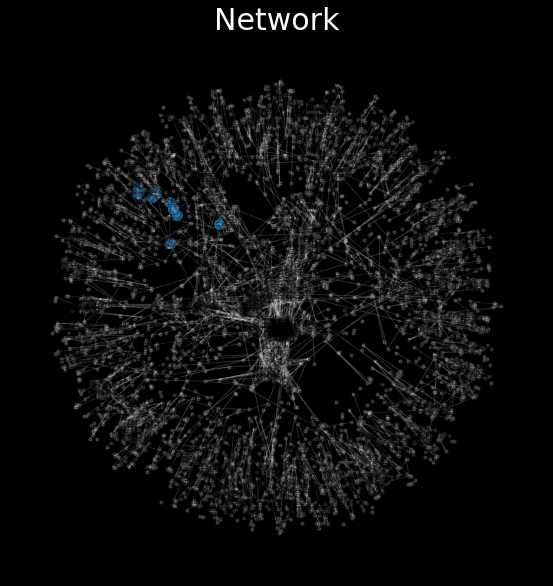

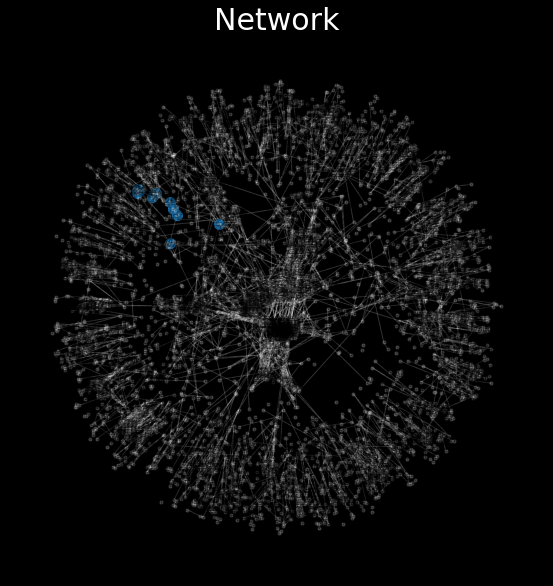

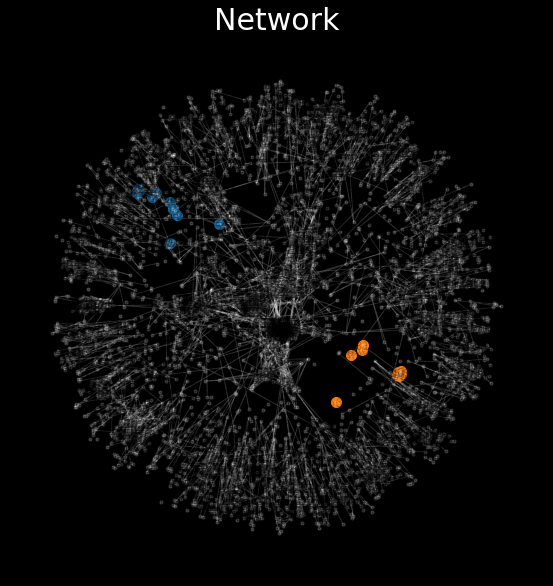

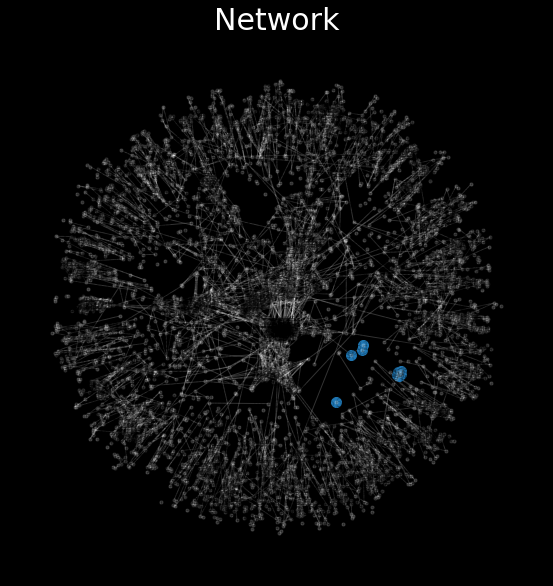

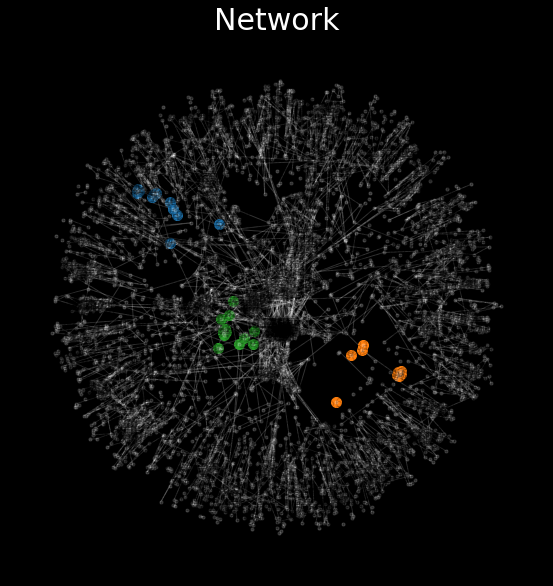

...

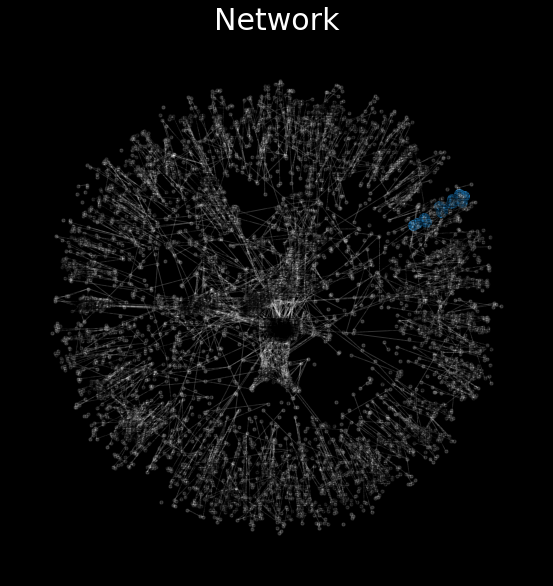

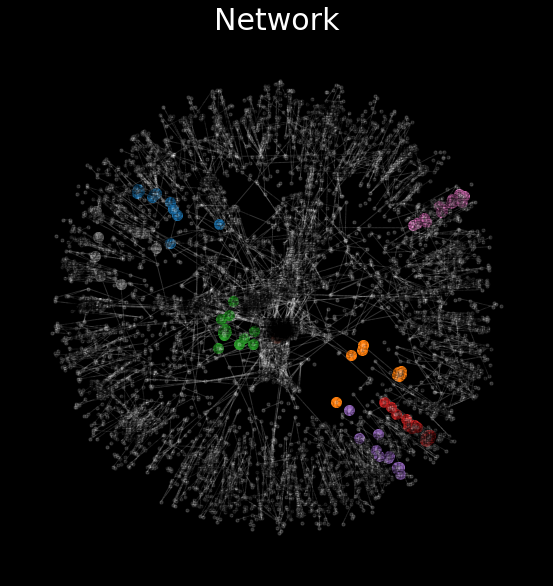

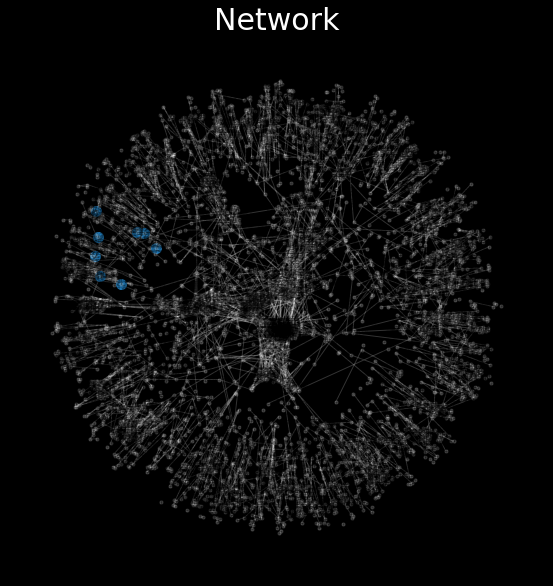

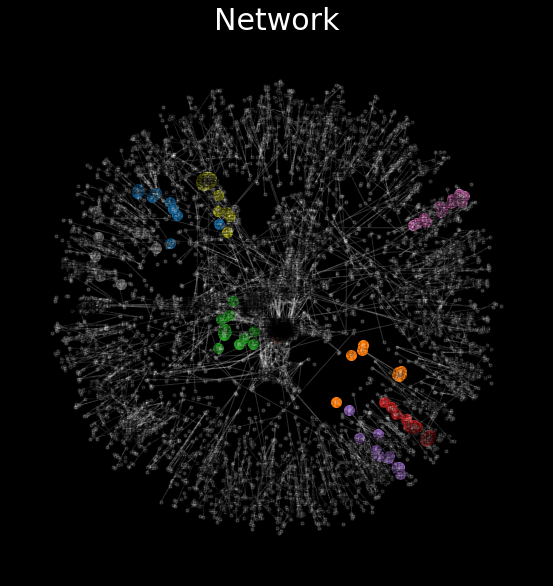

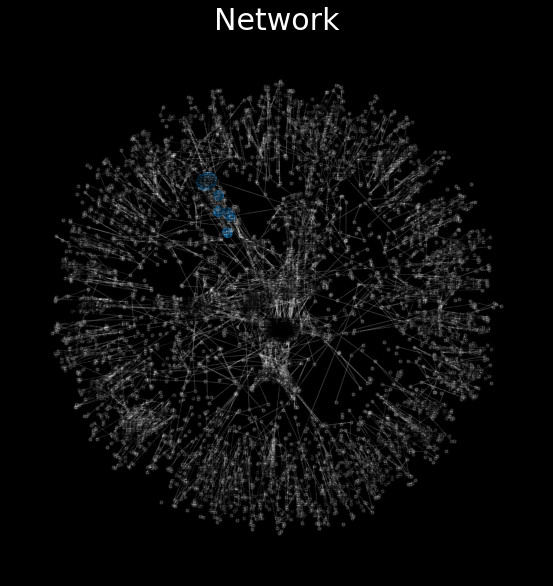

In [361]:
for j in range(1, 10):
    list_clusters = [clusters_in_order_k == np.unique(clusters_in_order_k)[i] for i in range(j)]               
    plot_network_test(sf_res, list_clusters)
    plt.show()
    list_clusters = [clusters_in_order_k == np.unique(clusters_in_order_k)[j-1]]               
    plot_network_test(sf_res, list_clusters)
    plt.show()

Similarly for cluster sizes sorted in descending order

/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/barbitovyu/miniconda3/envs/ml/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: 
The is_numlike function was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use isinstance(..., numbers.Number) instead.
  if cb.is_numlike(alpha):


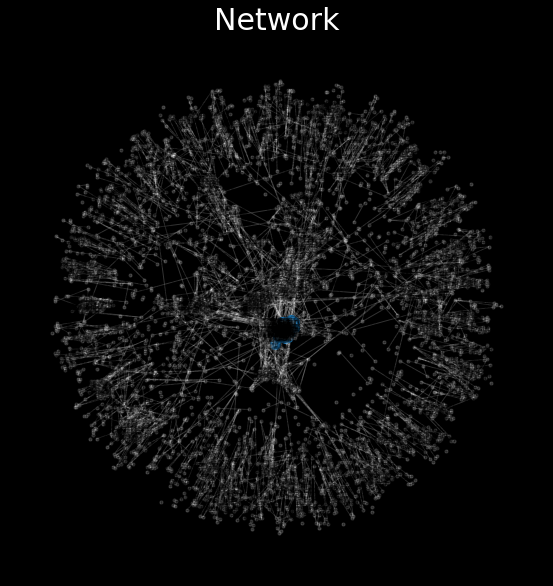

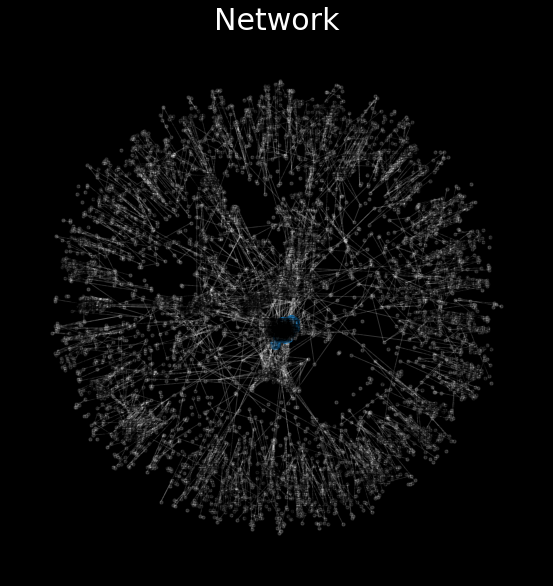

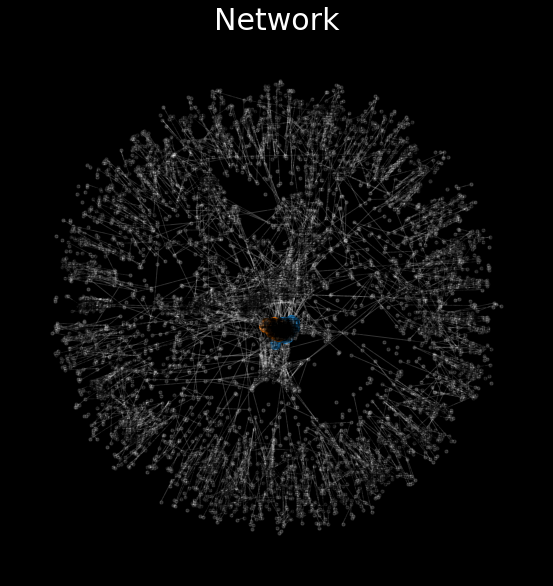

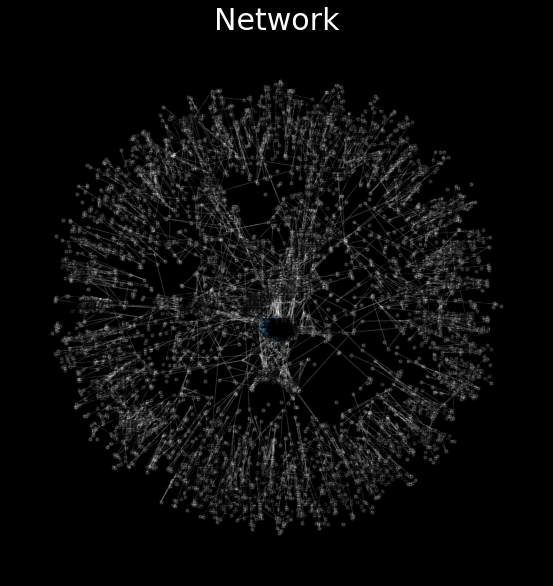

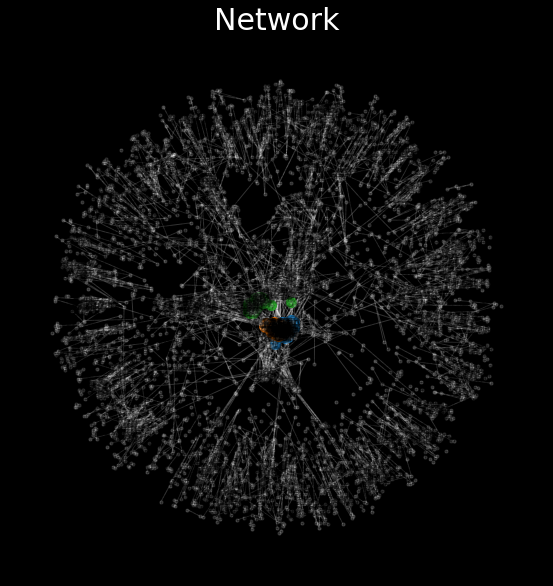

...

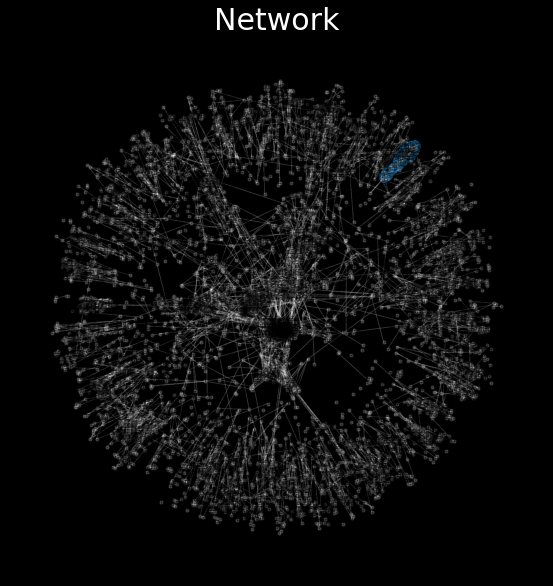

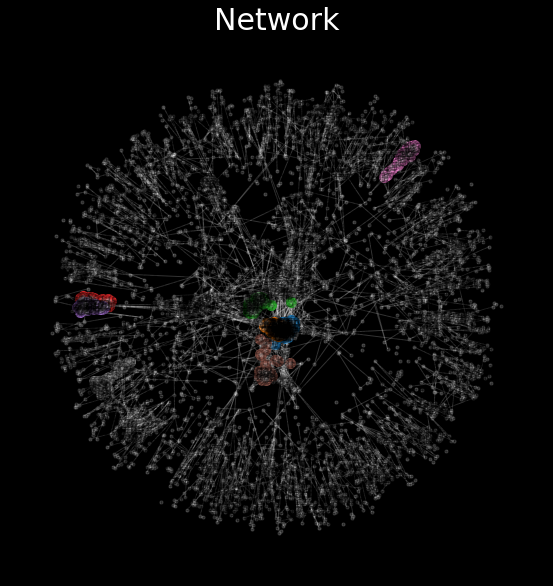

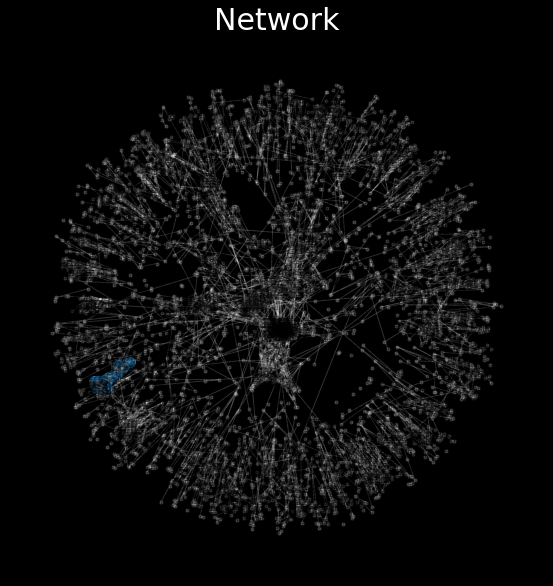

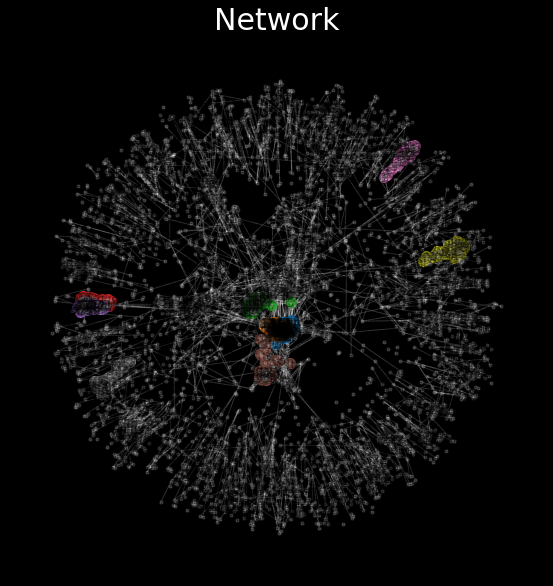

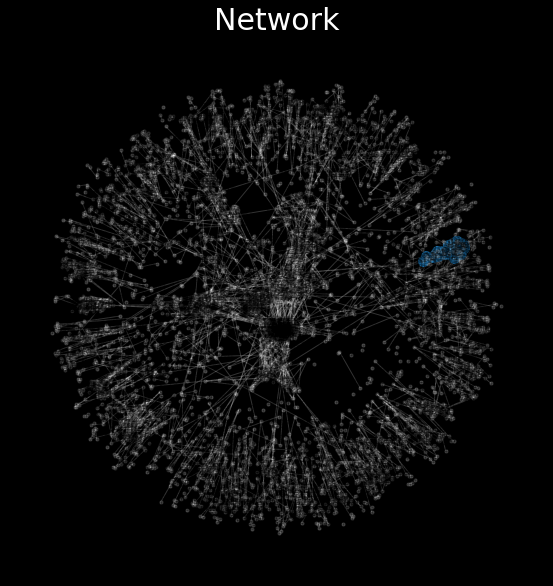

In [373]:
for j in range(1, 10):
    list_clusters = [clusters_in_order_k == unique_clusters_sorted[i] for i in range(j)]               
    plot_network_test(sf_res, list_clusters)
    plt.show()
    list_clusters = [clusters_in_order_k == unique_clusters_sorted[j - 1]]               
    plot_network_test(sf_res, list_clusters)
    plt.show()